In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Настройки отображения
sns.set(style="whitegrid", palette="muted", font_scale=1.2)

# Загружаем твой датасет
df = pd.read_csv("data/df_train_result_to_eda_3.csv")

In [104]:
def plot_salary_analysis(df):
    positions = df["position"].unique()

    # фиксированный порядок для категорий
    level_order = ["Trainee", "Junior", "Middle", "Senior", "Lead", "Chief", "Unknown"]
    exp_order = ["Нет опыта", "1–3 года", "3–6 лет", "Более 6 лет"]

    for pos in positions:
        df_pos = df[df["position"] == pos].copy()
        total_count = len(df_pos)

        # создаем аннотации с количеством
        df_pos["level_annot"] = df_pos["level"].astype(str) + \
            " (" + df_pos.groupby("level")["level"].transform("count").astype(str) + ")"
        df_pos["experience_annot"] = df_pos["experience"].astype(str) + \
            " (" + df_pos.groupby("experience")["experience"].transform("count").astype(str) + ")"

        # задаем порядок с аннотациями
        level_annot_order = [f"{lvl} ({df_pos['level'].tolist().count(lvl)})" for lvl in level_order if lvl in df_pos["level"].unique()]
        exp_annot_order = [f"{exp} ({df_pos['experience'].tolist().count(exp)})" for exp in exp_order if exp in df_pos["experience"].unique()]

        fig, axes = plt.subplots(2, 2, figsize=(16, 13))
        fig.suptitle(f"{pos} — всего строк: {total_count}", fontsize=16)

        # Salary From ~ Level
        sns.violinplot(
            data=df_pos, x="level_annot", y="salary from",
            hue="level_annot", legend=False, inner="quartile",
            ax=axes[0, 0], palette="Set2", order=level_annot_order
        )
        axes[0, 0].set_title("Salary From ~ Level")
        axes[0, 0].tick_params(axis="x", rotation=45)

        # Salary From ~ Experience
        sns.violinplot(
            data=df_pos, x="experience_annot", y="salary from",
            hue="experience_annot", legend=False, inner="quartile",
            ax=axes[0, 1], palette="Set2", order=exp_annot_order
        )
        axes[0, 1].set_title("Salary From ~ Experience")
        axes[0, 1].tick_params(axis="x", rotation=45)

        # Salary To ~ Level
        sns.violinplot(
            data=df_pos, x="level_annot", y="salary to",
            hue="level_annot", legend=False, inner="quartile",
            ax=axes[1, 0], palette="Set2", order=level_annot_order
        )
        axes[1, 0].set_title("Salary To ~ Level")
        axes[1, 0].tick_params(axis="x", rotation=45)

        # Salary To ~ Experience
        sns.violinplot(
            data=df_pos, x="experience_annot", y="salary to",
            hue="experience_annot", legend=False, inner="quartile",
            ax=axes[1, 1], palette="Set2", order=exp_annot_order
        )
        axes[1, 1].set_title("Salary To ~ Experience")
        axes[1, 1].tick_params(axis="x", rotation=45)

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

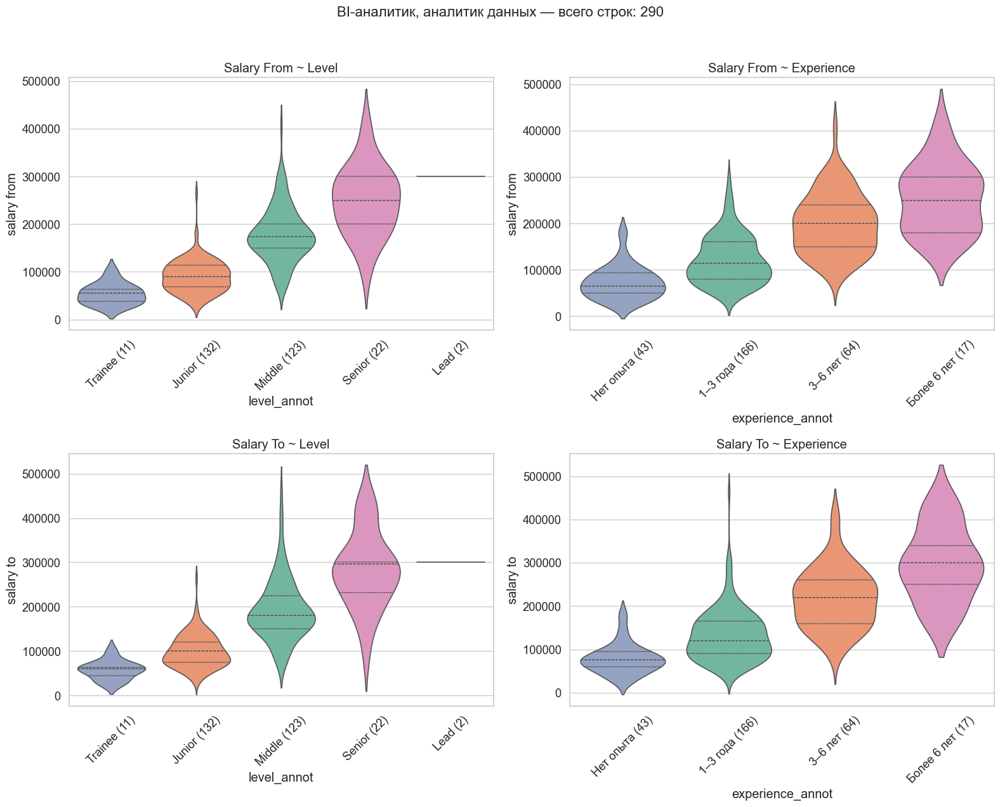

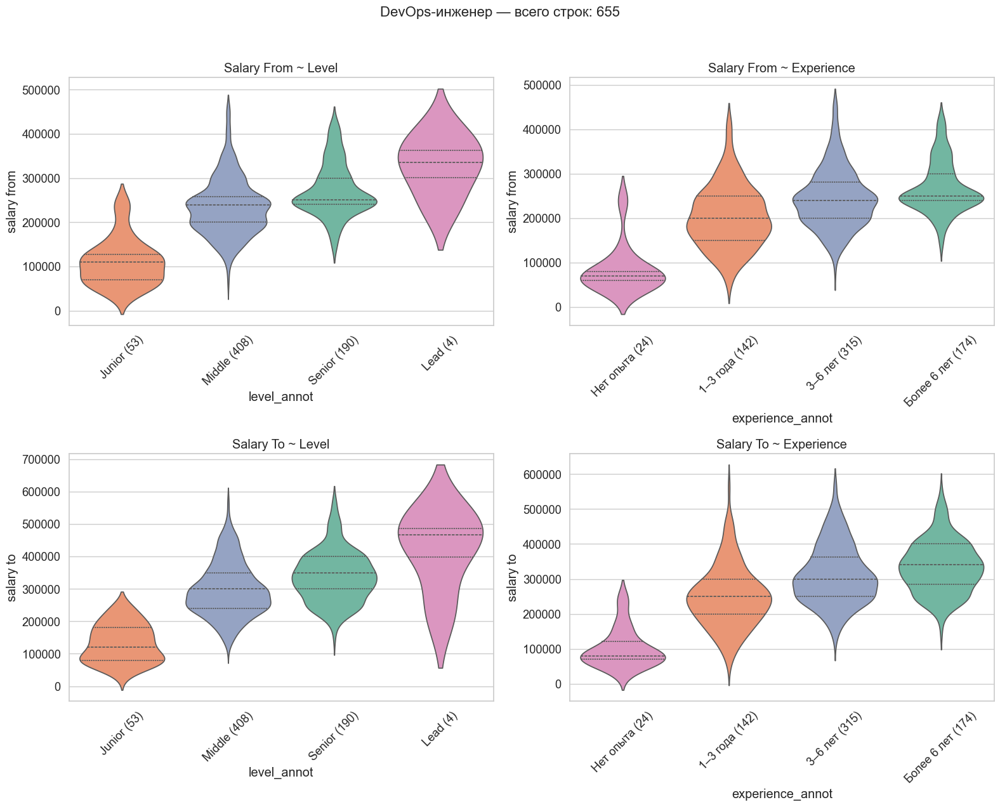

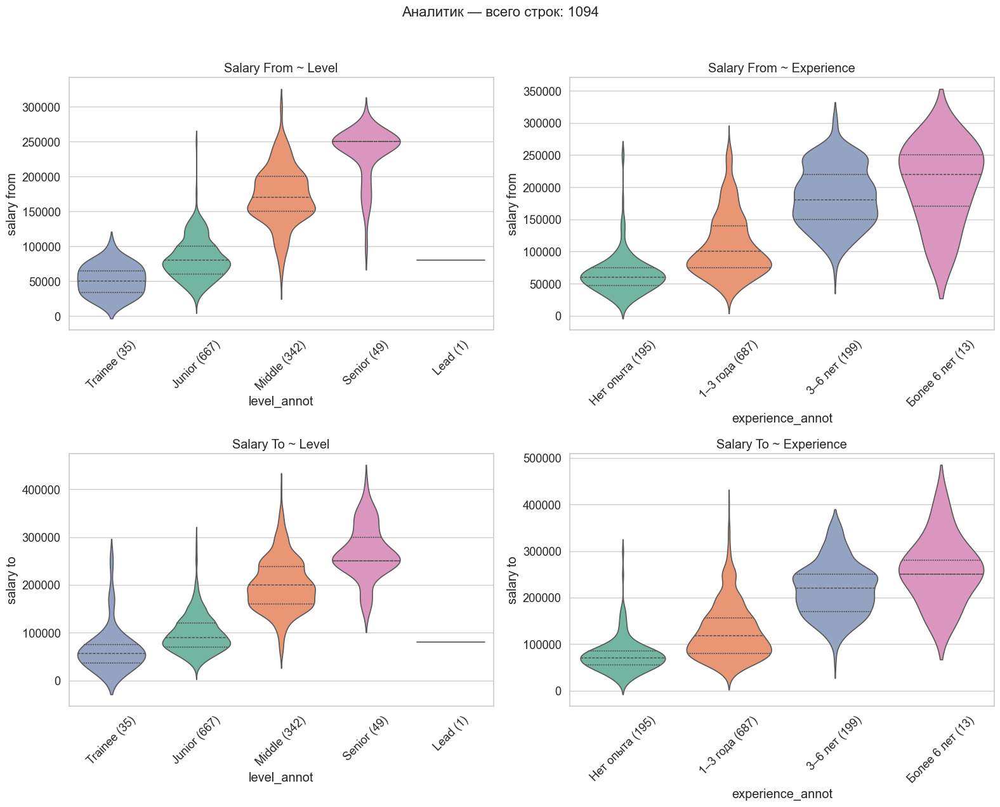

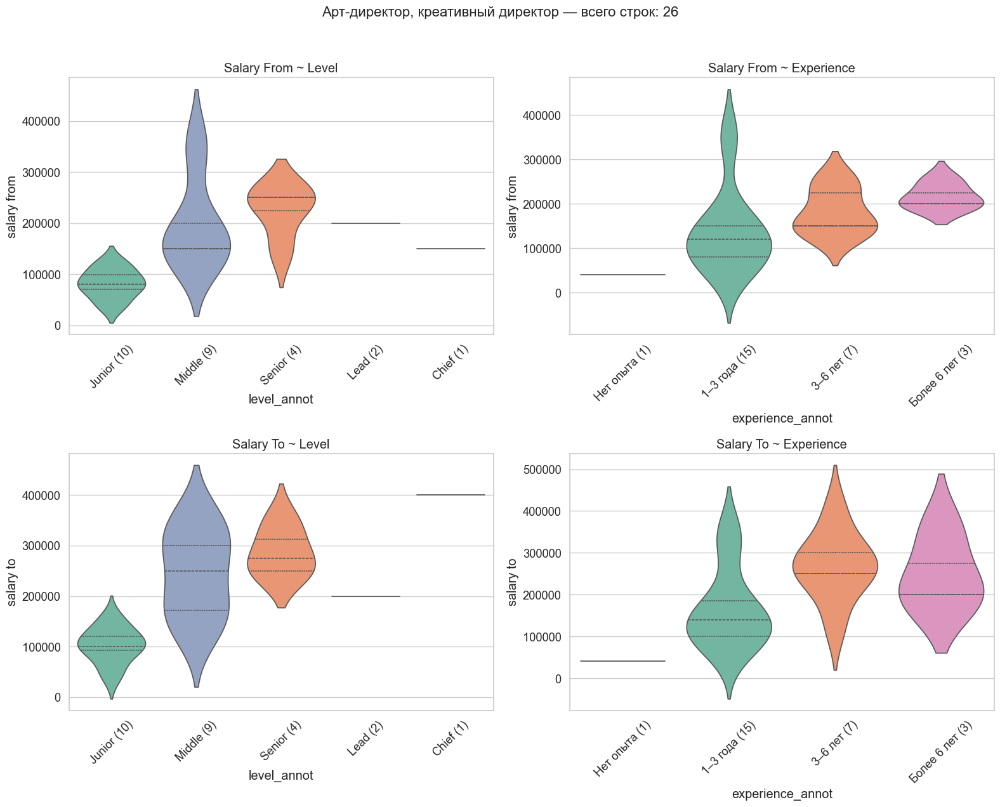

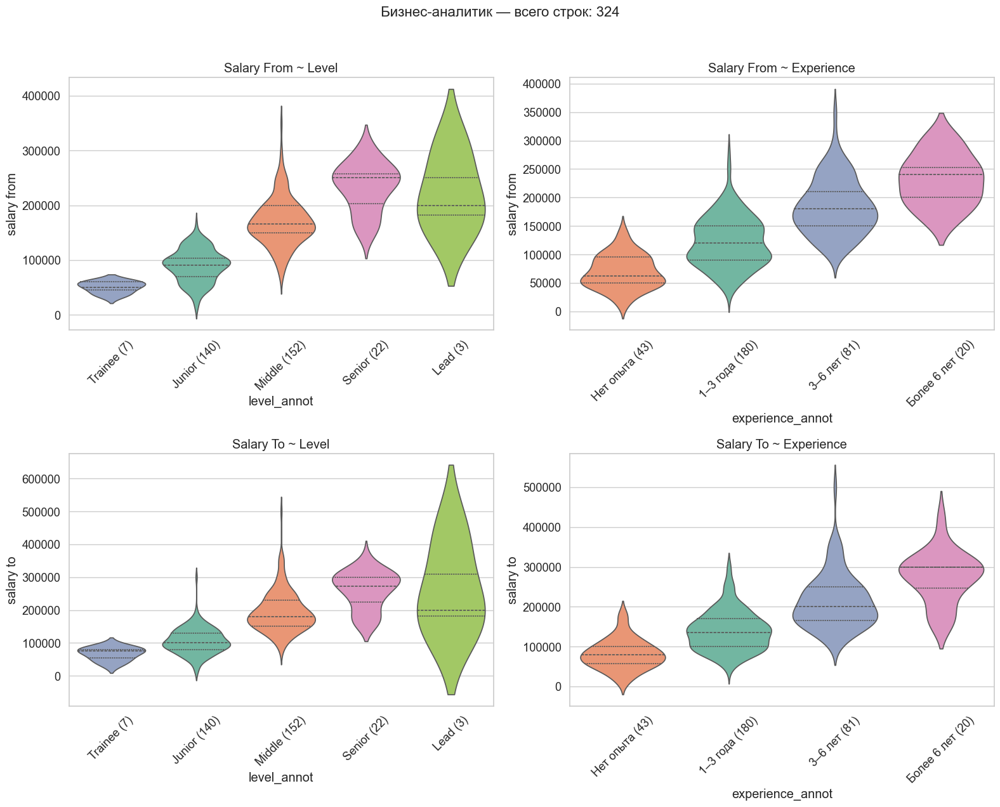

...

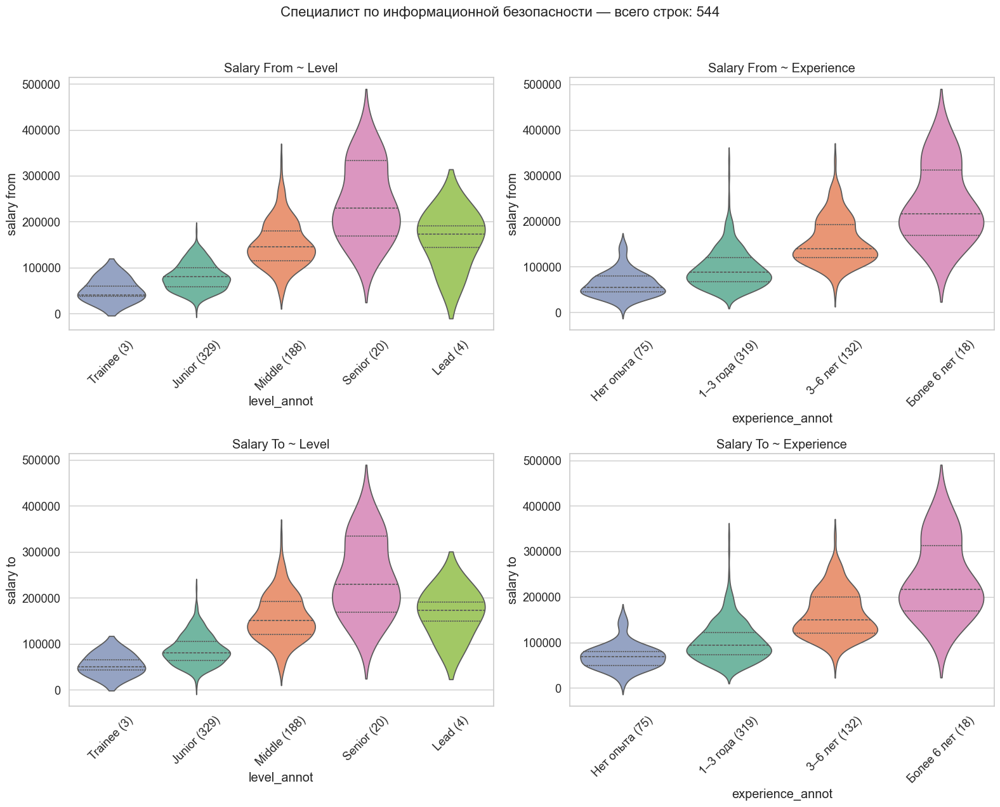

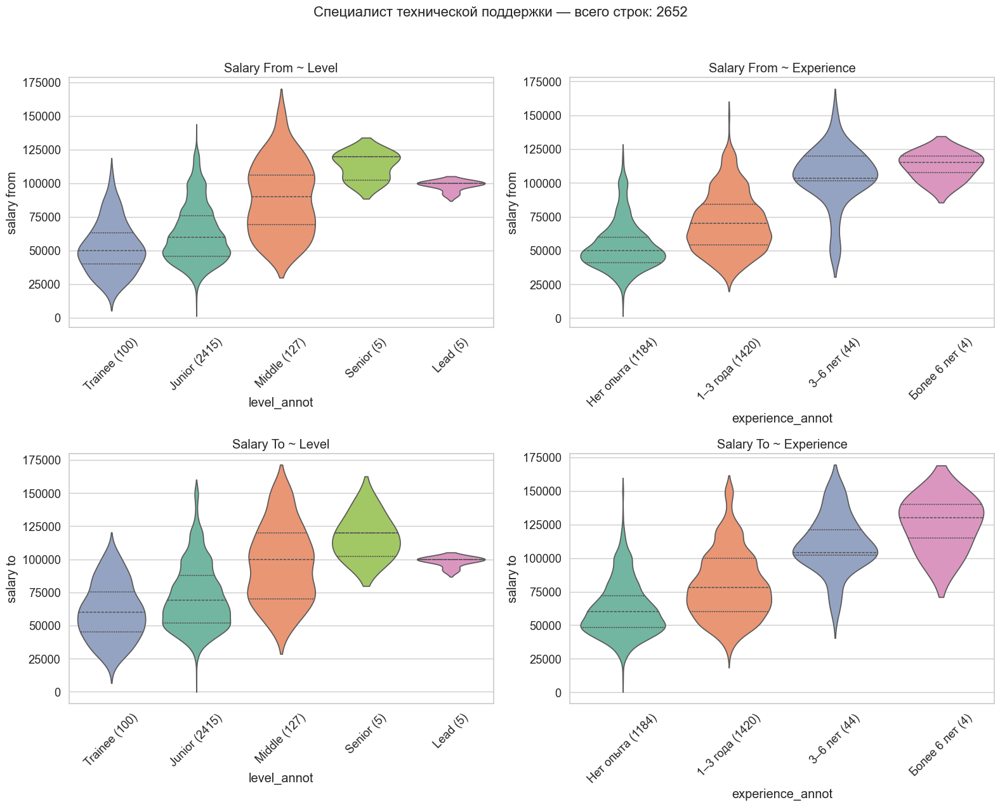

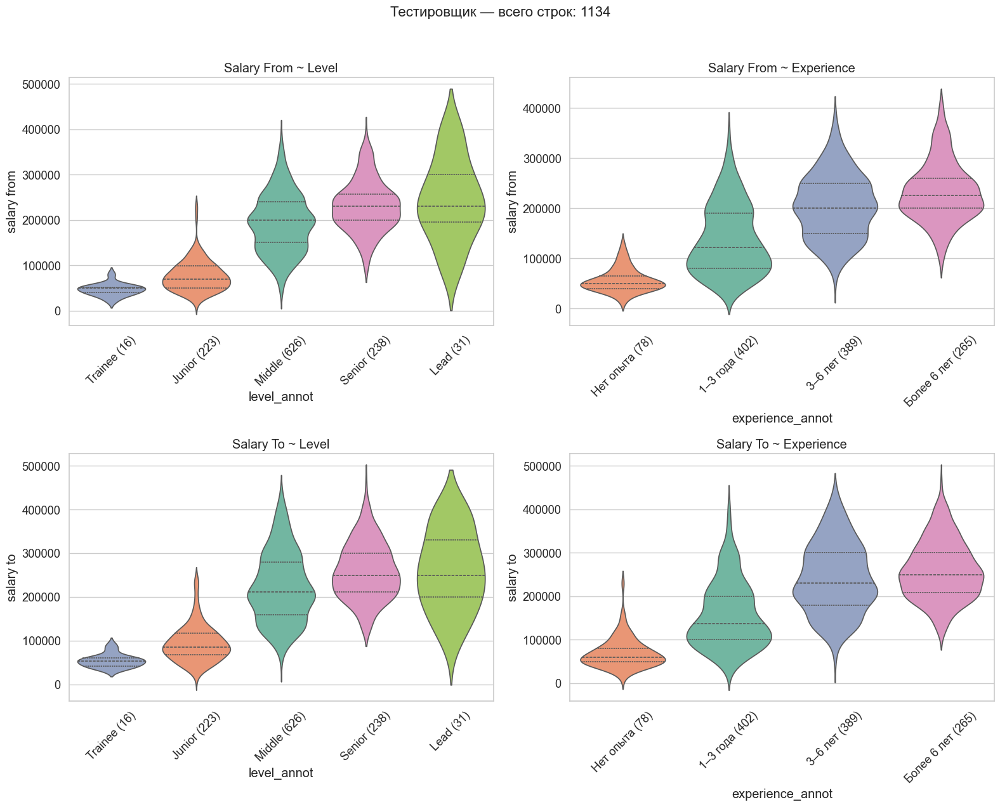

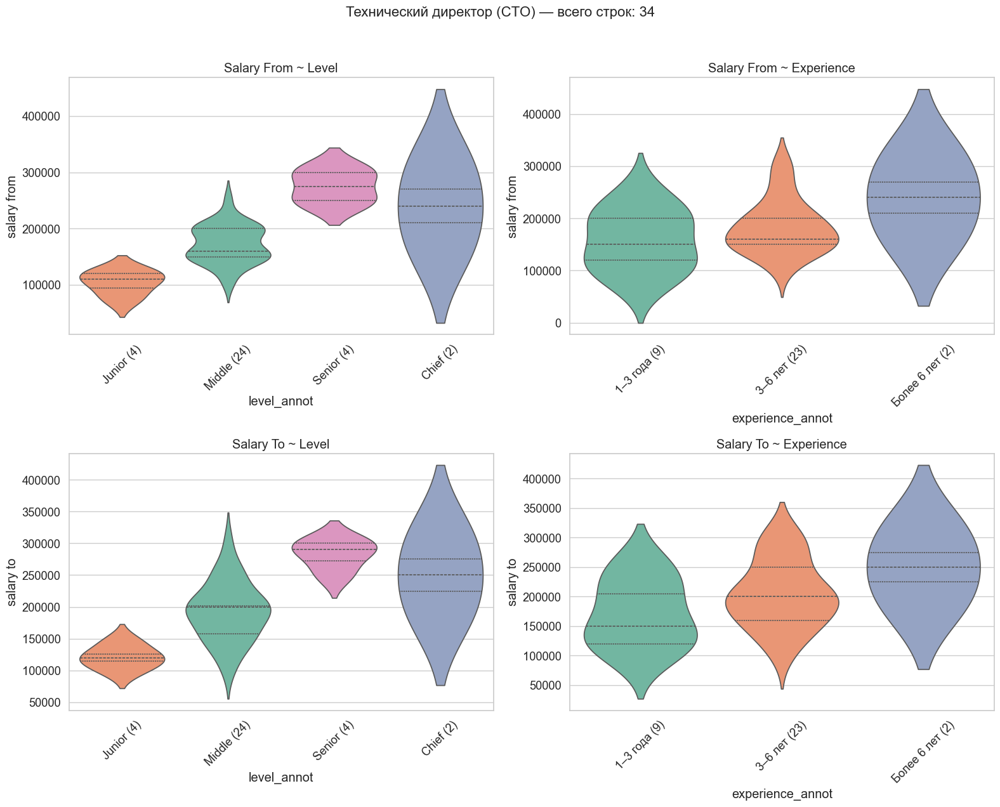

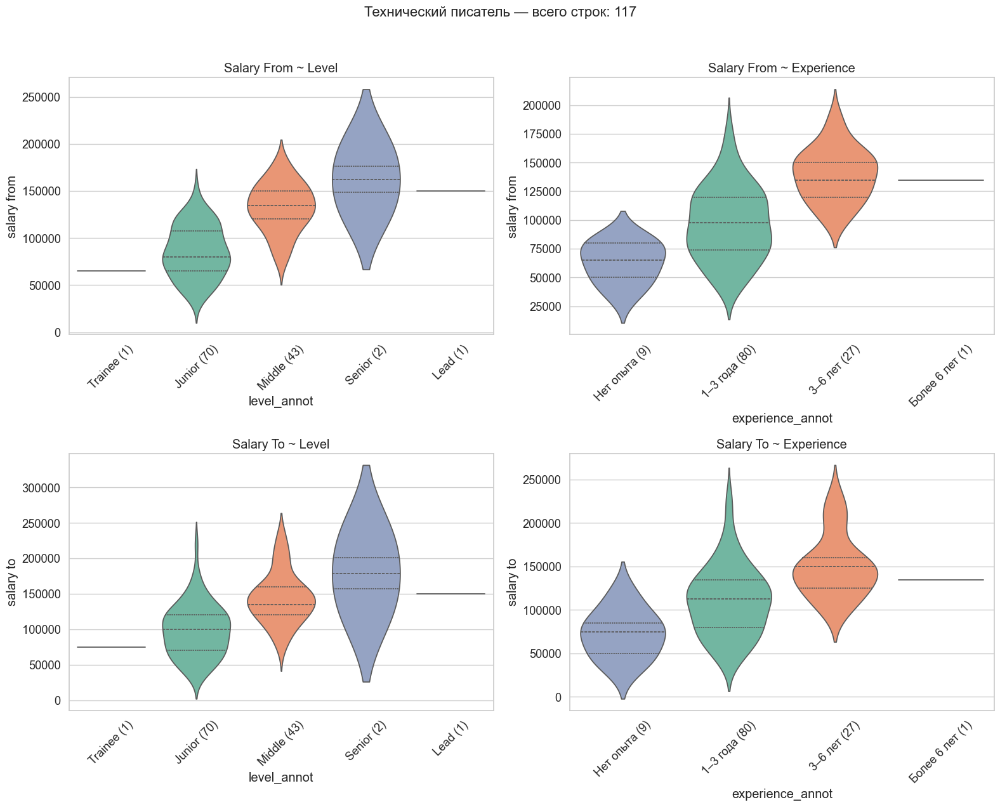

In [105]:
plot_salary_analysis(df)


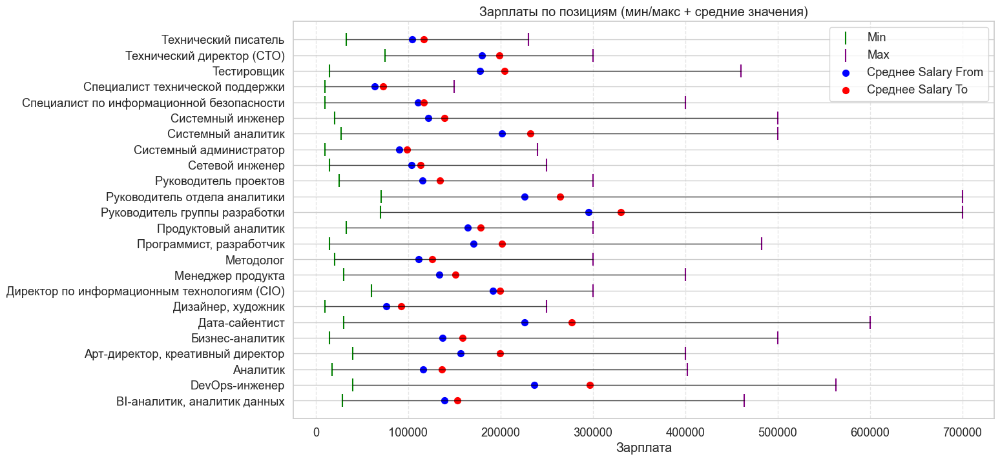

In [106]:
# Группировка по позиции
agg_df = df.groupby("position").agg({
    "salary from": ["min", "mean", "max"],
    "salary to": ["min", "mean", "max"]
}).reset_index()

# Упрощаем названия колонок
agg_df.columns = ["position", "from_min", "from_mean", "from_max", "to_min", "to_mean", "to_max"]

# Строим график
plt.figure(figsize=(14, 8))

for i, row in agg_df.iterrows():
    # линия от from_min до to_max (шире и цветная)
    plt.plot(
        [row["from_min"], row["to_max"]], [i, i],
        color="black", linewidth=1, alpha=0.7
    )
    
    # точки min/max
    plt.scatter(row["from_min"], i, color="green", marker="|", s=200, label="Min" if i==0 else "")
    plt.scatter(row["to_max"], i, color="purple", marker="|", s=200, label="Max" if i==0 else "")
    
    # точка среднего salary from
    plt.scatter(row["from_mean"], i, color="blue", s=50, label="Среднее Salary From" if i==0 else "")
    
    # точка среднего salary to
    plt.scatter(row["to_mean"], i, color="red", s=50, label="Среднее Salary To" if i==0 else "")

plt.yticks(range(len(agg_df)), agg_df["position"])
plt.xlabel("Зарплата")
plt.title("Зарплаты по позициям (мин/макс + средние значения)")
plt.legend()
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

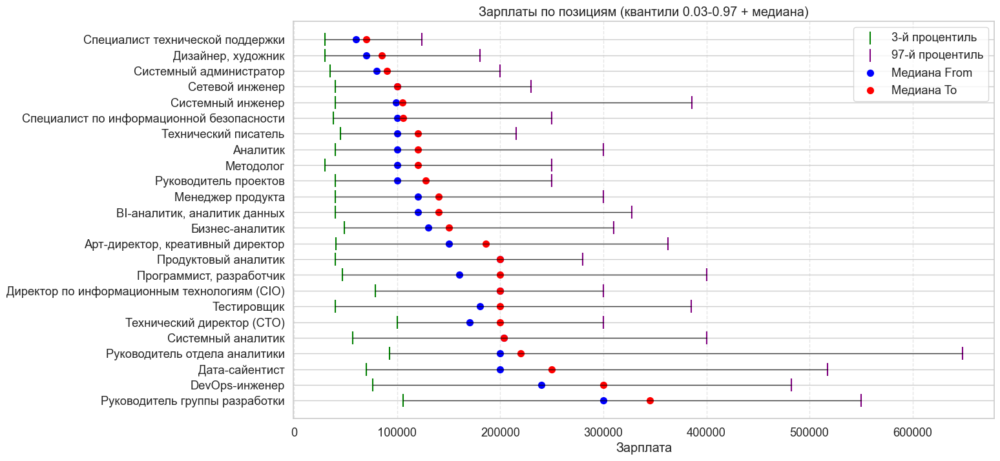

In [107]:
#Группировка по позиции с квантилями 0.03 и 0.97
agg_df = df.groupby("position").agg({
    "salary from": [lambda x: x.quantile(0.03), "median", lambda x: x.quantile(0.97)],
    "salary to": [lambda x: x.quantile(0.03), "median", lambda x: x.quantile(0.97)]
}).reset_index()

# Переименование колонок
agg_df.columns = [
    "position", 
    "from_q03", "from_median", "from_q97",
    "to_q03", "to_median", "to_q97"
]

# Сортировка по медиане 'to_median'
agg_df = agg_df.sort_values("to_median", ascending=False).reset_index(drop=True)

# Строим график
plt.figure(figsize=(14, 8))

for i, row in agg_df.iterrows():
    # линия диапазона (3%-97%)
    plt.plot(
        [row["from_q03"], row["to_q97"]], [i, i],
        color="black", linewidth=1, alpha=0.7
    )
    
    # точки 3% и 97%
    plt.scatter(row["from_q03"], i, color="green", marker="|", s=200, label="3-й процентиль" if i==0 else "")
    plt.scatter(row["to_q97"], i, color="purple", marker="|", s=200, label="97-й процентиль" if i==0 else "")
    
    # медиана
    plt.scatter(row["from_median"], i, color="blue", s=50, label="Медиана From" if i==0 else "")
    plt.scatter(row["to_median"], i, color="red", s=50, label="Медиана To" if i==0 else "")

plt.yticks(range(len(agg_df)), agg_df["position"])
plt.xlabel("Зарплата")
plt.title("Зарплаты по позициям (квантили 0.03-0.97 + медиана)")
plt.legend()
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

In [108]:
level_salary_rules = {
    "BI-аналитик, аналитик данных": [
        {"level":"Middle", "salary_from":350000, "new_level":"Senior"},
        {"level":"Junior", "salary_from":160000, "new_level":"Middle"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"exp":"Нет опыта", "salary_from":130000, "new_exp":"1–3 года"},
    ],
   "DevOps-инженер": [
        {"level":"Middle", "salary_from":370000, "new_level":"Senior"},
        {"level":"Junior", "salary_from":160000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Senior", "salary_from_max":160000, "new_level":"Middle"},
        {"exp":"Нет опыта", "salary_from":180000, "new_exp":"1–3 года"},
    ],
    "Аналитик": [
        {"level":"Middle", "salary_from":300000, "new_level":"Senior"},
        {"level":"Junior", "salary_from":180000, "new_level":"Middle"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"exp":"Нет опыта", "salary_from":180000, "new_exp":"1–3 года"},
    ],
    "Арт-директор, креативный директор": [
        {"level":"Middle", "salary_from":300000, "new_level":"Senior"},
        #{"level":"Senior", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Senior", "salary_from_max":180000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
    ],
    "Бизнес-аналитик": [
        {"level":"Middle", "salary_from":290000, "new_level":"Senior"},
        {"level":"Lead", "salary_from_max":160000, "new_level":"Middle"},
        {"level":"Lead", "salary_from":160001, "new_level":"Senior"},
    ],
    "Дата-сайентист": [
        {"level":"Middle", "salary_from":310000, "new_level":"Senior"},
        {"level":"Middle", "salary_from_max":80000, "new_level":"Junior"},
        {"level":"Lead", "salary_from_max":160000, "new_level":"Middle"},
    ],
    "Дизайнер, художник": [
        {"level":"Middle", "salary_from":170000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"level":"Lead", "salary_from_max":100000, "new_level":"Junior"},
    ],
    "Менеджер продукта": [
        {"level":"Middle", "salary_from":280000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":180000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":140000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":100000, "new_level":"Middle"},
    ],
    "Методолог": [
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"level":"Middle", "salary_from":250000, "new_level":"Senior"},
    ],
    "Программист, разработчик": [
        {"level":"Middle", "salary_from":310000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":140000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":80000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":150000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":180000, "new_level":"Middle"},
        {"exp":"Нет опыта", "salary_from":160000, "new_exp":"1–3 года"},
    ],
    "Продуктовый аналитик": [
        {"level":"Middle", "salary_from_max":150000, "new_level":"Junior"}, 
        {"level":"Junior", "salary_from":150000, "new_level":"Middle"},
    ],
    "Руководитель группы разработки": [
        {"level":"Middle", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Middle", "salary_from":380000, "new_level":"Senior"},
        #{"level":"Lead", "salary_from_max":150000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
    ],
    "Руководитель отдела аналитики": [
        {"level":"Middle", "salary_from":310000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":180000, "new_level":"Senior"},
    ],
    "Руководитель проектов": [
        {"level":"Middle", "salary_from":250000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":160000, "new_level":"Middle"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
    ],
    "Сетевой инженер": [
        {"level":"Middle", "salary_from":230000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":160000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":80000, "action":"delete"},
    ],
    "Системный администратор": [
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":50000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":140000, "new_level":"Middle"},
        {"level":"Senior", "salary_from_max":80000, "new_level":"Middle"},
    ],
    "Системный аналитик": [
        {"level":"Middle", "salary_from":350000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":70000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":180000, "new_level":"Middle"},
        {"exp":"Нет опыта", "salary_from":150000, "new_exp":"1–3 года"},
    ],
    "Системный инженер": [
        {"level":"Middle", "salary_from":320000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":50000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":160000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":80000, "action":"delete"},
    ],
    "Специалист по информационной безопасности": [
        {"level":"Middle", "salary_from":300000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":50000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":160000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":80000, "action":"delete"},
    ],
    "Специалист технической поддержки": [
        {"level":"Middle", "salary_from_max":50000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":140000, "new_level":"Middle"},
    ],
    "Тестировщик": [
        {"level":"Middle", "salary_from":350000, "new_level":"Senior"},
        {"level":"Senior", "salary_from_max":100000, "new_level":"Middle"},
        {"level":"Middle", "salary_from_max":90000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":150000, "new_level":"Middle"},
        {"level":"Lead", "salary_from_max":50000, "action":"delete"},
    ],
    "Технический директор (CTO)": [
        {"level":"Middle", "salary_from":300000, "new_level":"Senior"},
        {"level":"Middle", "salary_from_max":100000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":150000, "new_level":"Middle"},
        {"exp":"Нет опыта", "salary_from":0, "action":"delete"},
        {"level":"Chief", "salary_from":0, "action":"delete"},
    ],
    "Технический писатель": [
        {"level":"Middle", "salary_from":200000, "new_level":"Senior"},
        {"level":"Middle", "salary_from_max":80000, "new_level":"Junior"},
        {"level":"Junior", "salary_from":130000, "new_level":"Middle"},
    ]
}


In [109]:



def apply_level_salary_rules(df, rules_dict):
    df = df.copy()
    to_delete_idx = []

    for position, rules in rules_dict.items():
        pos_mask = df['position'] == position
        df_pos = df[pos_mask]

        for rule in rules:
            mask = pos_mask.copy()
            
            # Проверка уровня
            if "level" in rule:
                mask &= df['level'] == rule["level"]
            
            # Проверка опыта
            if "exp" in rule:
                mask &= df['experience'] == rule["exp"]
            
            # Проверка salary_from (верхняя граница)
            if "salary_from_max" in rule:
                mask &= df['salary from'] <= rule["salary_from_max"]
            
            # Проверка salary_from (нижняя граница)
            if "salary_from" in rule:
                mask &= df['salary from'] >= rule["salary_from"]
            
            # Применяем действия
            if "new_level" in rule:
                df.loc[mask, "level"] = rule["new_level"]
            if "new_exp" in rule:
                df.loc[mask, "experience"] = rule["new_exp"]
            if "action" in rule and rule["action"] == "delete":
                to_delete_idx.extend(df[mask].index.tolist())

    if to_delete_idx:
        df = df.drop(index=to_delete_idx)
        df = df.reset_index(drop=True)

    return df




In [110]:
# Использование:
df_train_result = apply_level_salary_rules(df, level_salary_rules)

In [ ]:
df_train_result.to_csv('data/df_train_result_from_eda_3.csv', index=False)

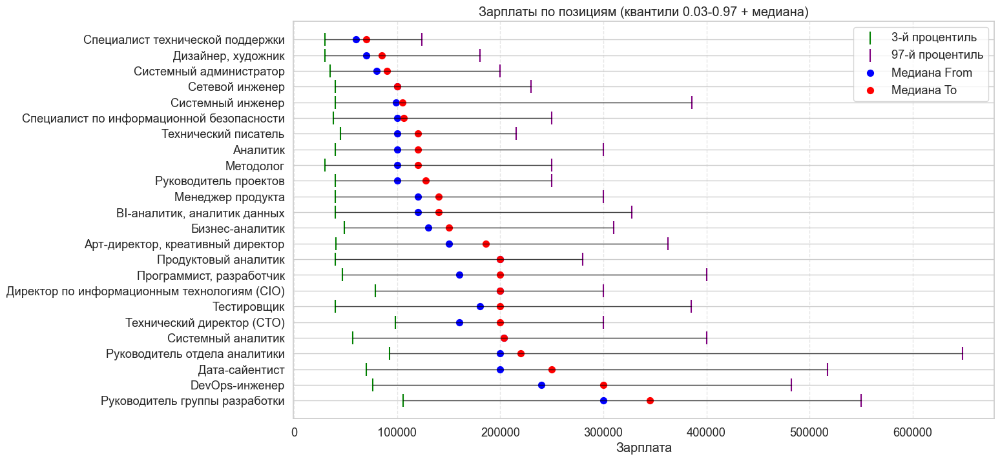

In [112]:
#Группировка по позиции с квантилями 0.03 и 0.97
agg_df = df_train_result.groupby("position").agg({
    "salary from": [lambda x: x.quantile(0.03), "median", lambda x: x.quantile(0.97)],
    "salary to": [lambda x: x.quantile(0.03), "median", lambda x: x.quantile(0.97)]
}).reset_index()

# Переименование колонок
agg_df.columns = [
    "position", 
    "from_q03", "from_median", "from_q97",
    "to_q03", "to_median", "to_q97"
]

# Сортировка по медиане 'to_median'
agg_df = agg_df.sort_values("to_median", ascending=False).reset_index(drop=True)

# Строим график
plt.figure(figsize=(14, 8))

for i, row in agg_df.iterrows():
    # линия диапазона (3%-97%)
    plt.plot(
        [row["from_q03"], row["to_q97"]], [i, i],
        color="black", linewidth=1, alpha=0.7
    )
    
    # точки 3% и 97%
    plt.scatter(row["from_q03"], i, color="green", marker="|", s=200, label="3-й процентиль" if i==0 else "")
    plt.scatter(row["to_q97"], i, color="purple", marker="|", s=200, label="97-й процентиль" if i==0 else "")
    
    # медиана
    plt.scatter(row["from_median"], i, color="blue", s=50, label="Медиана From" if i==0 else "")
    plt.scatter(row["to_median"], i, color="red", s=50, label="Медиана To" if i==0 else "")

plt.yticks(range(len(agg_df)), agg_df["position"])
plt.xlabel("Зарплата")
plt.title("Зарплаты по позициям (квантили 0.03-0.97 + медиана)")
plt.legend()
plt.grid(axis="x", linestyle="--", alpha=0.5)
plt.show()

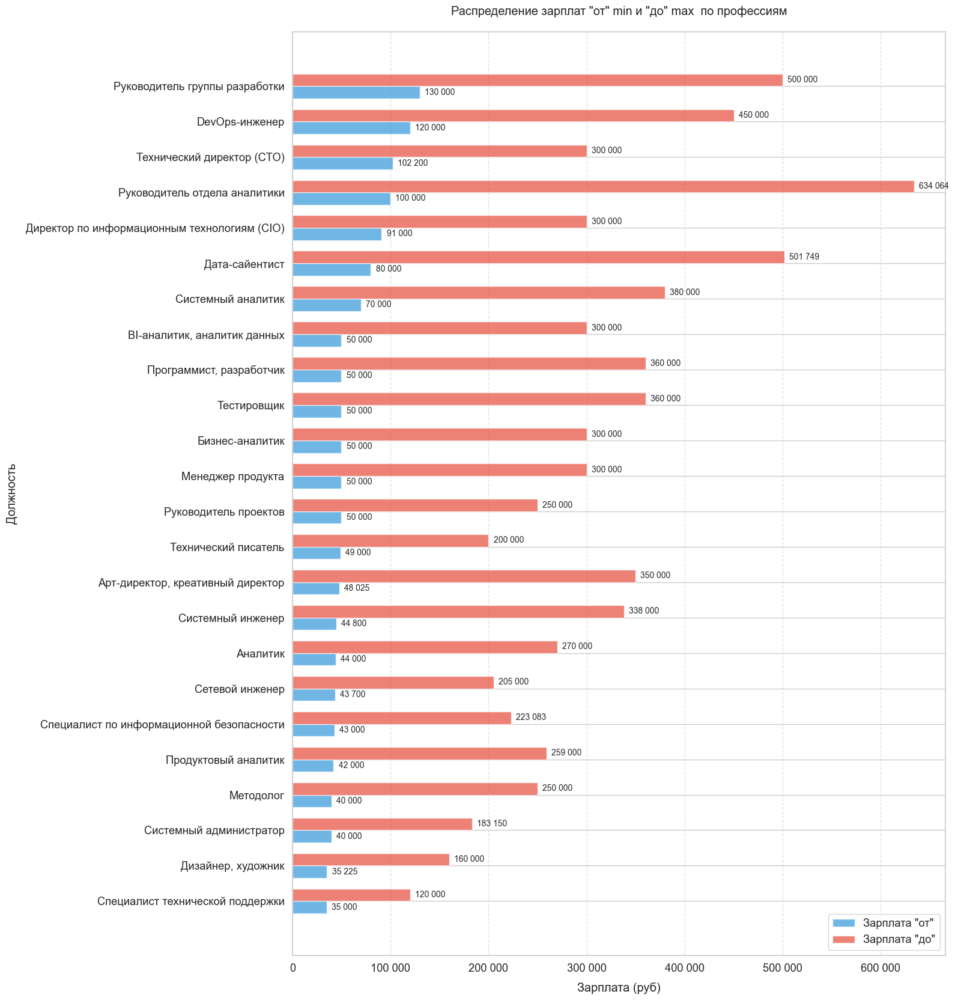

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FuncFormatter
import numpy as np

# Устанавливаем стиль seaborn
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (16, 12)
plt.rcParams['font.size'] = 12

# Функция для форматирования чисел (100000 -> 100 000)
def thousands_formatter(x, pos):
    return '{:,.0f}'.format(x).replace(',', ' ')

thousands_format = FuncFormatter(thousands_formatter)

# Вычисляем порог для каждой позиции
def calculate_mode(series):
    try:
        return series.mean()  # mode()[0] 
    except:
        return np.nan
    
def calculate_mode_min(series):
    try:
        return series.quantile(0.05)  #quantile(0.05)
    except:
        return np.nan
    
def calculate_mode_max(series):
    try:
        return series.quantile(0.95)  #quantile(0.95)
    except:
        return np.nan    


salary_stats = df_train_result.groupby('position').agg({
    'salary from': calculate_mode_min,
    'salary to': calculate_mode_max
}).reset_index()

# Сортируем по убыванию salary from
salary_stats = salary_stats.sort_values('salary from', ascending=True)

# Создаем фигуру
fig, ax = plt.subplots(figsize=(16, len(salary_stats)*0.7))

# Параметры для столбцов
bar_height = 0.35
y_pos = np.arange(len(salary_stats))

# Рисуем горизонтальные столбцы
bars_from = ax.barh(y_pos - bar_height/2, salary_stats['salary from'], 
                   height=bar_height, color='#3498db', alpha=0.7, label='Зарплата "от"')
bars_to = ax.barh(y_pos + bar_height/2, salary_stats['salary to'], 
                 height=bar_height, color='#e74c3c', alpha=0.7, label='Зарплата "до"')

# Настройки осей
ax.set_yticks(y_pos)
ax.set_yticklabels(salary_stats['position'])
ax.xaxis.set_major_formatter(thousands_format)
ax.grid(axis='x', linestyle='--', alpha=0.6)

# Добавляем значения на столбцы
for i, (val_from, val_to) in enumerate(zip(salary_stats['salary from'], salary_stats['salary to'])):
    ax.text(val_from + 5000, i - bar_height/2, f'{val_from:,.0f}'.replace(',', ' '), 
            va='center', ha='left', fontsize=10)
    ax.text(val_to + 5000, i + bar_height/2, f'{val_to:,.0f}'.replace(',', ' '), 
            va='center', ha='left', fontsize=10)

# Легенда и заголовок
ax.legend(loc='lower right')
#plt.title('quantile зарплат "от"  (0.05) и "до" (0.95)  по позициям', pad=20)
plt.title('Распределение зарплат "от" min и "до" max  по профессиям', pad=20)
plt.xlabel('Зарплата (руб)', labelpad=10)
plt.ylabel('Должность', labelpad=10)
plt.tight_layout()

plt.show()

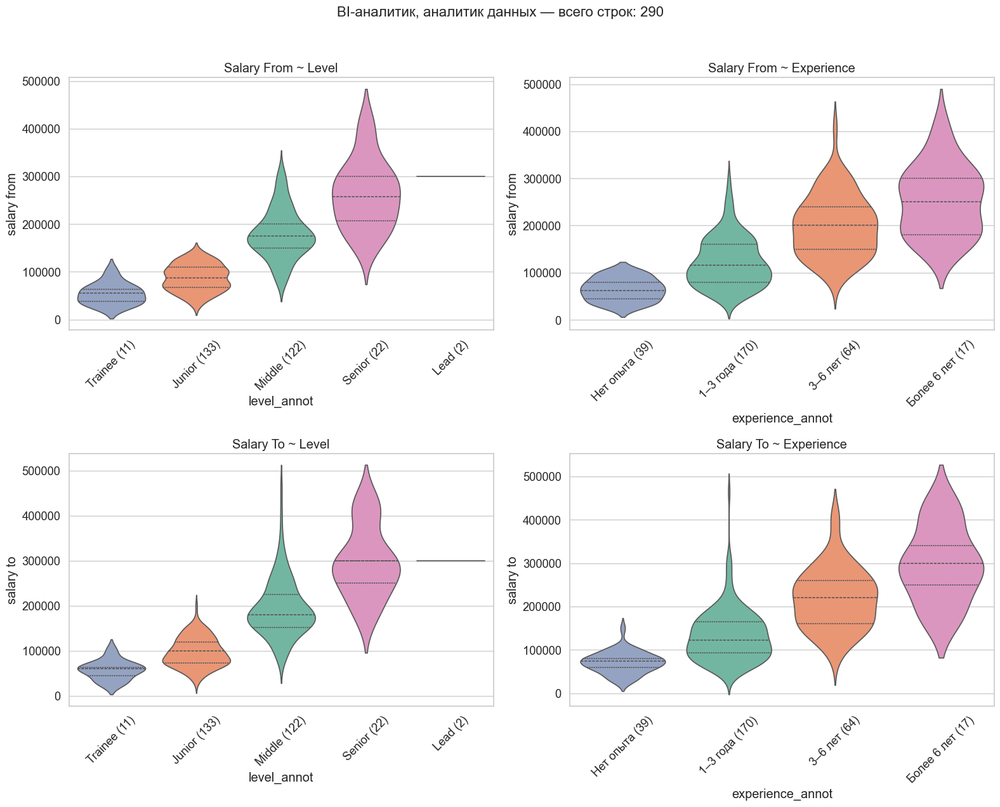

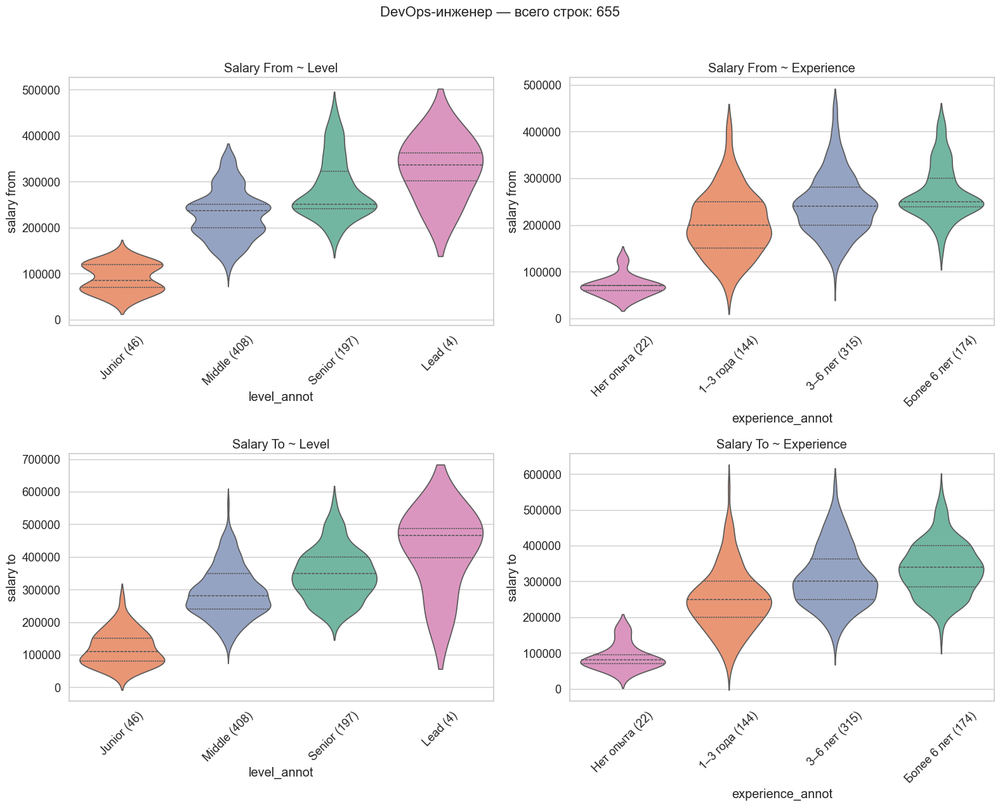

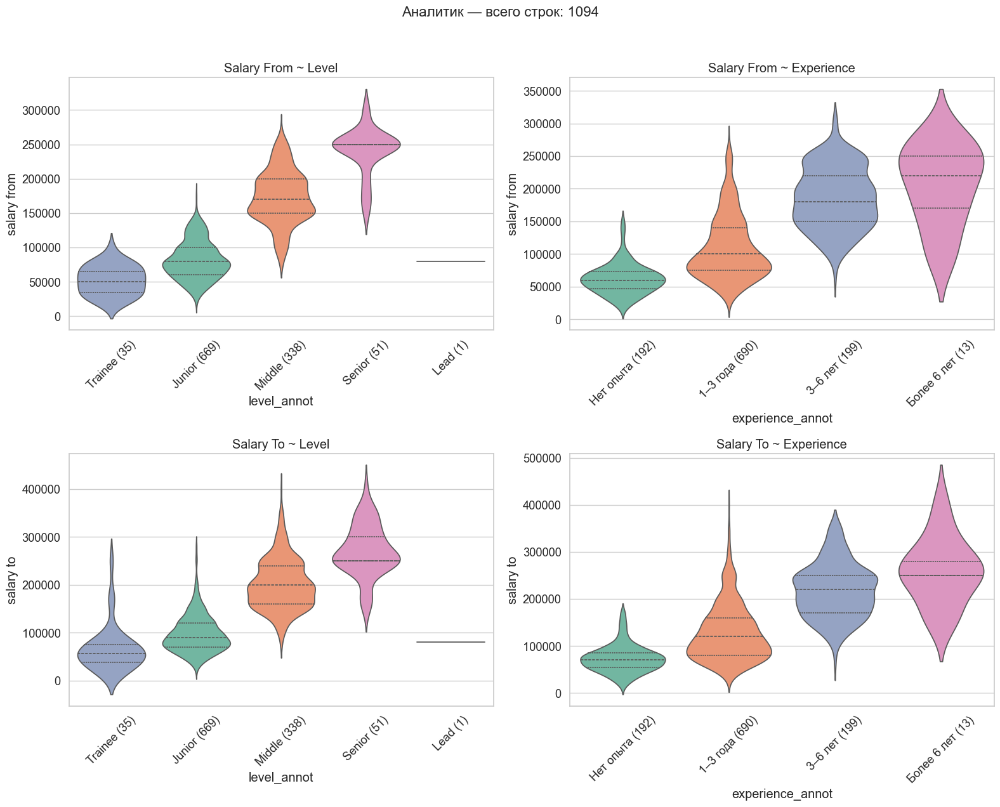

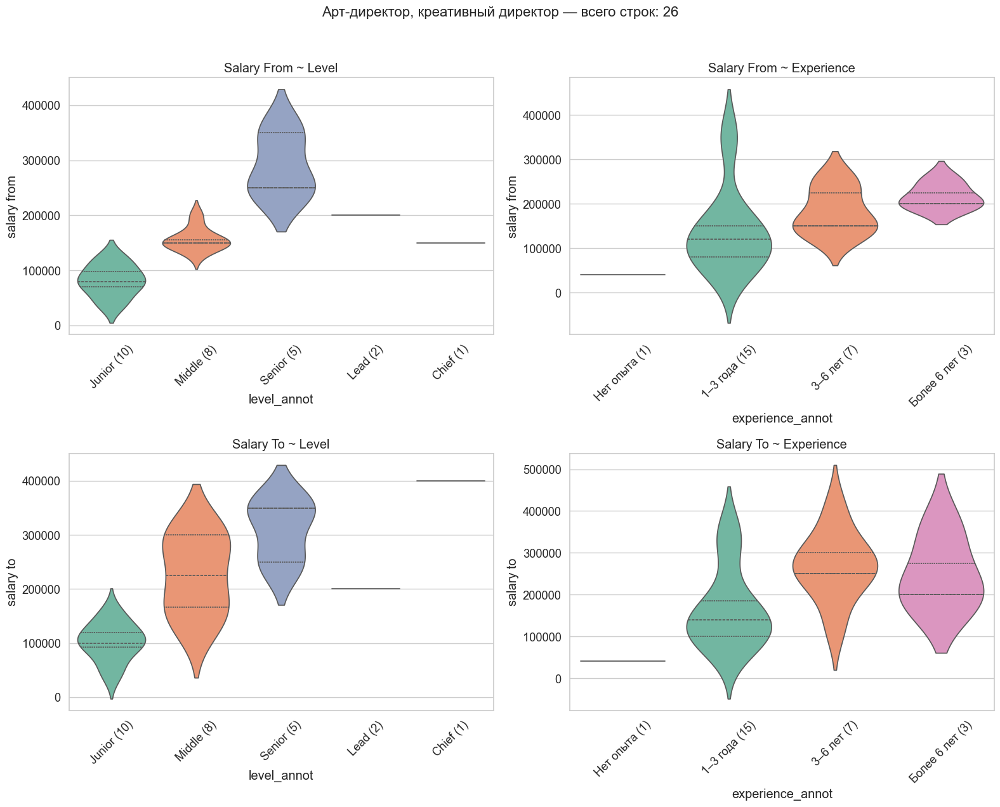

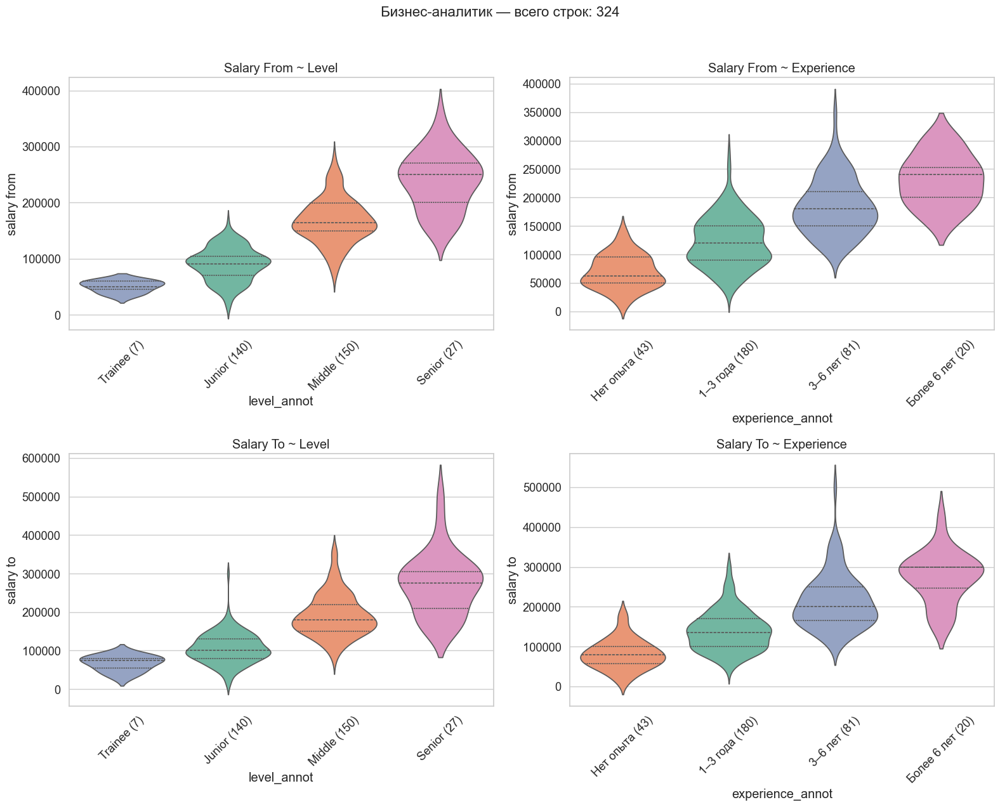

...

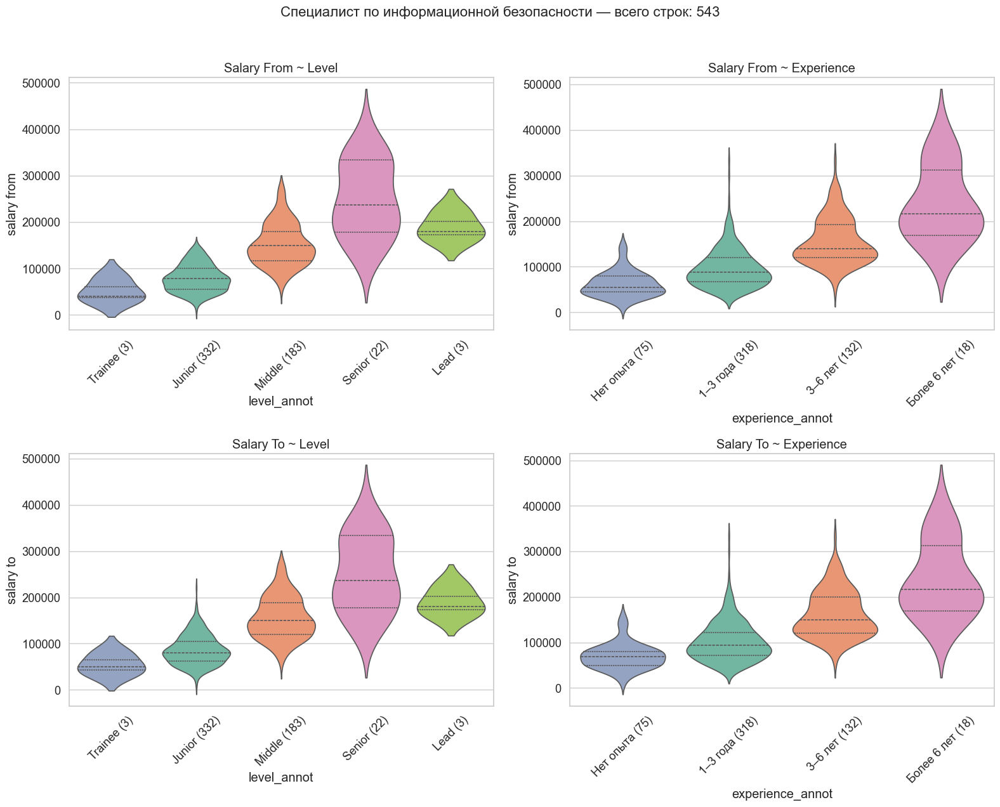

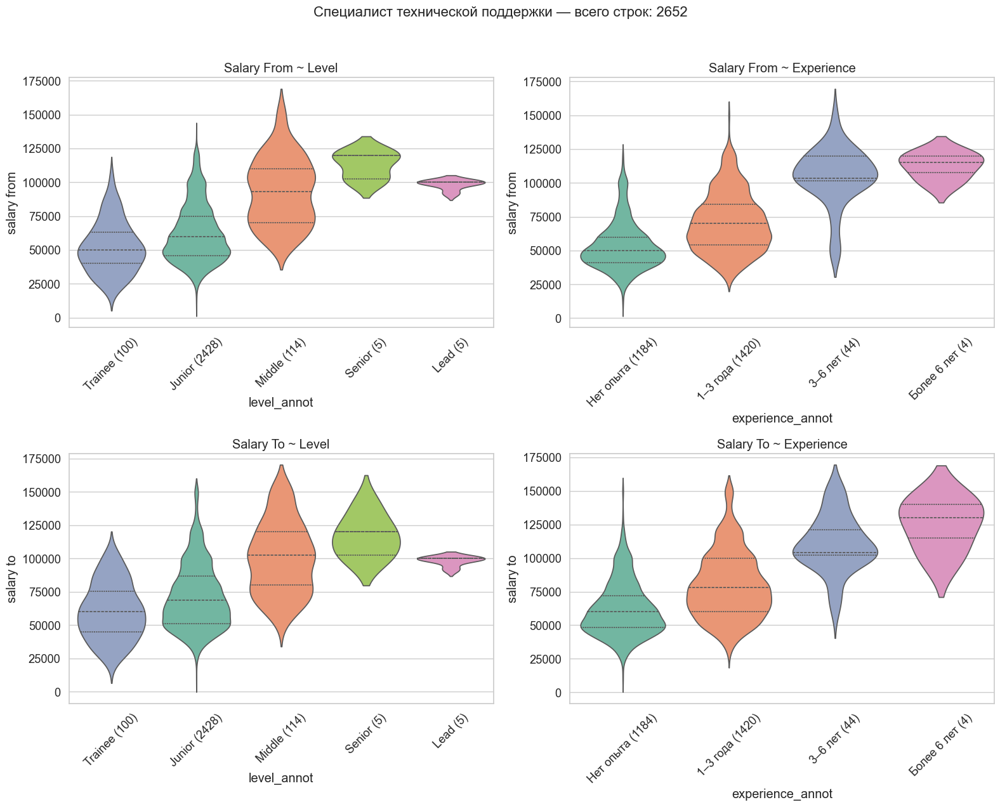

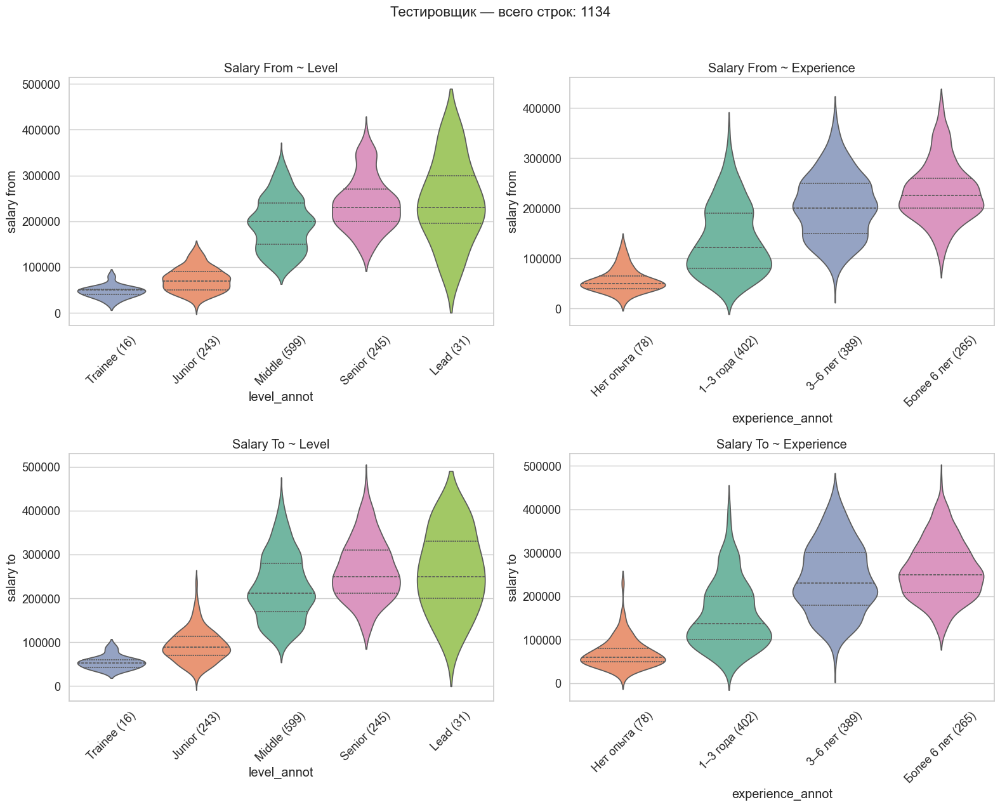

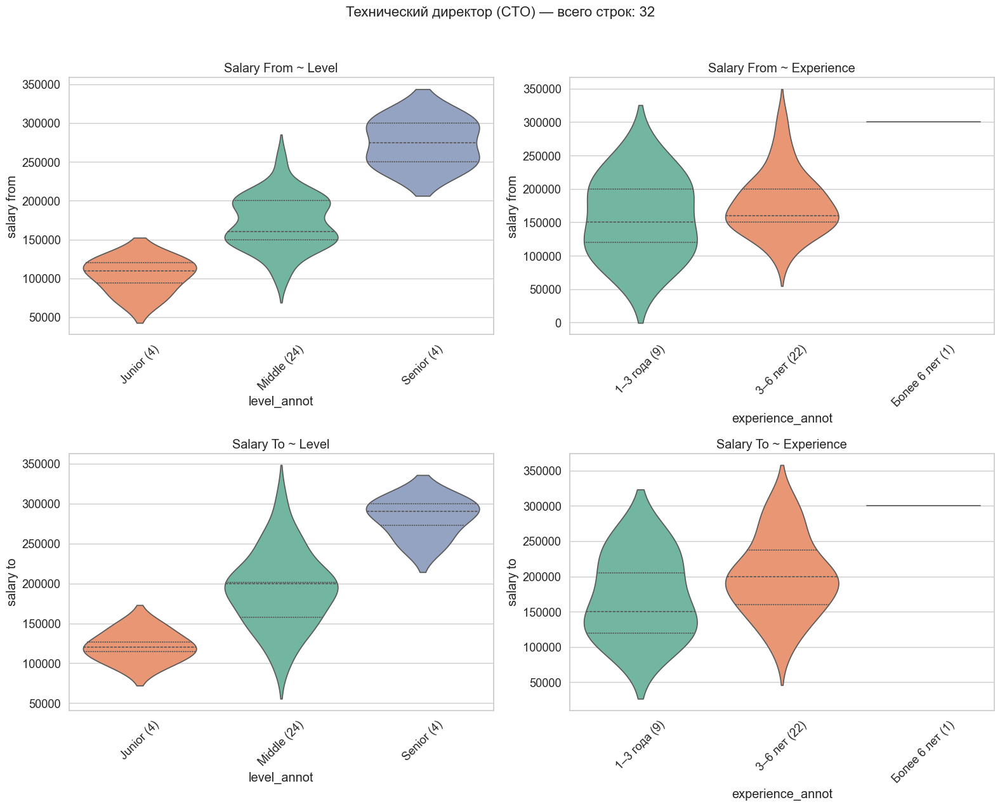

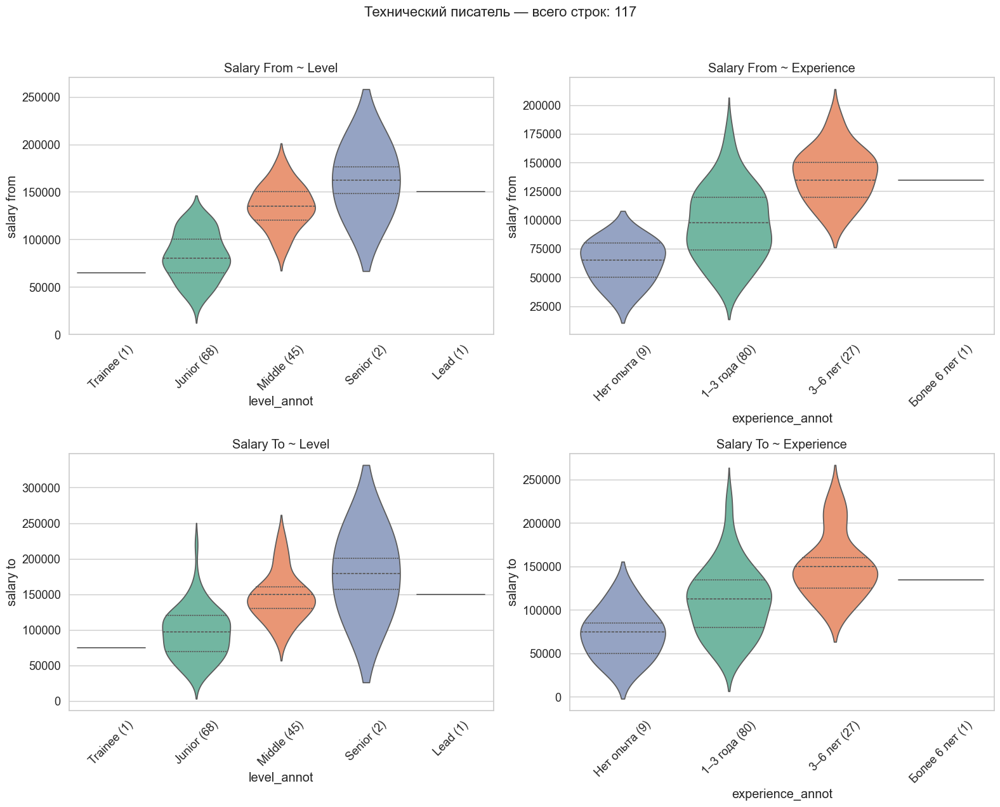

In [113]:
plot_salary_analysis(df_train_result)